In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import scipy
import seaborn as sns
from sklearn import datasets
from PIL import Image
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Ridge #ordinary linear regression + w/ ridge regularization
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline
import folium

read file 

In [2]:
df = pd.read_csv('yellow_tripdata_2020-01.csv')

/Users/maithaalqahtani/opt/anaconda3/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3165: DtypeWarning: Columns (6) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


In [3]:
df.shape

(6405008, 18)

In [4]:
df_sample= df.sample(n = 1000000)

In [5]:
df_sample

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge
3300732,2.0,2020-01-17 16:38:50,2020-01-17 16:46:36,2.0,1.08,1.0,N,230,161,2.0,6.5,1.0,0.5,0.00,0.0,0.3,10.80,2.5
1247601,2.0,2020-01-08 07:25:57,2020-01-08 07:42:03,1.0,2.84,1.0,N,186,125,2.0,13.0,0.0,0.5,0.00,0.0,0.3,16.30,2.5
2157529,2.0,2020-01-12 09:37:04,2020-01-12 09:45:56,1.0,1.48,1.0,N,230,246,1.0,8.0,0.0,0.5,2.26,0.0,0.3,13.56,2.5
3255624,2.0,2020-01-17 12:30:27,2020-01-17 12:43:02,1.0,1.72,1.0,N,48,141,1.0,9.5,0.0,0.5,3.84,0.0,0.3,16.64,2.5
4768513,1.0,2020-01-24 19:16:02,2020-01-24 19:29:52,1.0,2.00,1.0,N,211,186,1.0,10.5,3.5,0.5,2.95,0.0,0.3,17.75,2.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
445670,2.0,2020-01-03 17:24:24,2020-01-03 17:34:03,1.0,1.06,1.0,N,186,249,1.0,6.0,1.0,0.5,2.06,0.0,0.3,12.36,2.5
4549219,2.0,2020-01-23 20:11:39,2020-01-23 20:15:11,5.0,1.00,1.0,N,230,43,1.0,5.0,0.5,0.5,1.76,0.0,0.3,10.56,2.5
1552365,1.0,2020-01-09 15:15:40,2020-01-09 15:18:14,1.0,0.40,1.0,N,246,246,1.0,4.0,2.5,0.5,1.80,0.0,0.3,9.10,2.5
587533,1.0,2020-01-04 14:46:27,2020-01-04 14:50:28,3.0,0.70,1.0,N,90,100,1.0,5.0,2.5,0.5,1.65,0.0,0.3,9.95,2.5


In [6]:
df_sample.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1000000 entries, 3300732 to 4715955
Data columns (total 18 columns):
 #   Column                 Non-Null Count    Dtype  
---  ------                 --------------    -----  
 0   VendorID               989893 non-null   float64
 1   tpep_pickup_datetime   1000000 non-null  object 
 2   tpep_dropoff_datetime  1000000 non-null  object 
 3   passenger_count        989893 non-null   float64
 4   trip_distance          1000000 non-null  float64
 5   RatecodeID             989893 non-null   float64
 6   store_and_fwd_flag     989893 non-null   object 
 7   PULocationID           1000000 non-null  int64  
 8   DOLocationID           1000000 non-null  int64  
 9   payment_type           989893 non-null   float64
 10  fare_amount            1000000 non-null  float64
 11  extra                  1000000 non-null  float64
 12  mta_tax                1000000 non-null  float64
 13  tip_amount             1000000 non-null  float64
 14  tolls_amount

In [7]:
sample_train, sample_test = train_test_split(df_sample, test_size=0.2,random_state=0)

In [8]:
sample_test.shape

(200000, 18)

In [9]:
sample_train, sample_val = train_test_split(sample_train, test_size=0.25,random_state=0)

In [10]:
sample_val.shape

(200000, 18)

In [11]:
sample_train.shape

(600000, 18)

In [12]:
sample_train.head()

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge
1865738,1.0,2020-01-10 21:24:32,2020-01-10 21:28:57,2.0,0.70,1.0,N,148,79,1.0,5.0,3.0,0.5,2.20,0.0,0.3,11.00,2.5
3425130,2.0,2020-01-18 02:04:52,2020-01-18 02:15:26,1.0,2.43,1.0,N,164,143,1.0,10.0,0.5,0.5,2.76,0.0,0.3,16.56,2.5
3715458,2.0,2020-01-19 17:36:13,2020-01-19 17:41:57,1.0,4.05,1.0,N,132,10,2.0,12.5,0.0,0.5,0.00,0.0,0.3,13.30,0.0
6279722,2.0,2020-01-31 19:37:49,2020-01-31 20:02:58,5.0,6.60,1.0,N,249,236,1.0,23.5,1.0,0.5,3.75,0.0,0.3,31.55,2.5
1138794,2.0,2020-01-07 16:40:10,2020-01-08 00:00:00,1.0,0.94,1.0,N,114,107,1.0,5.5,1.0,0.5,1.47,0.0,0.3,11.27,2.5


In [13]:
sample_val.head()

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge
1143289,2.0,2020-01-07 16:10:46,2020-01-07 16:25:31,1.0,1.22,1.0,N,230,186,1.0,10.0,1.0,0.5,2.86,0.0,0.3,17.16,2.5
5603246,2.0,2020-01-28 20:19:34,2020-01-28 20:38:23,1.0,3.50,1.0,N,113,143,1.0,15.0,0.5,0.5,2.50,0.0,0.3,21.30,2.5
4895081,2.0,2020-01-25 11:38:01,2020-01-25 11:40:43,1.0,0.48,1.0,N,164,164,1.0,4.0,0.0,0.5,1.10,0.0,0.3,8.40,2.5
4484892,2.0,2020-01-23 15:27:37,2020-01-23 15:54:04,5.0,4.11,1.0,N,148,163,1.0,18.0,0.0,0.5,4.26,0.0,0.3,25.56,2.5
5263493,2.0,2020-01-27 08:17:44,2020-01-27 08:27:00,1.0,1.25,1.0,N,230,100,1.0,7.5,0.0,0.5,1.08,0.0,0.3,11.88,2.5


In [14]:
sample_test.head()

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge
3517956,1.0,2020-01-18 16:23:54,2020-01-18 16:29:04,0.0,0.80,1.0,N,238,238,1.0,5.0,2.5,0.5,2.05,0.0,0.3,10.35,2.5
4853804,1.0,2020-01-25 03:08:16,2020-01-25 03:21:22,1.0,8.60,1.0,N,127,48,1.0,24.5,3.0,0.5,5.00,0.0,0.3,33.30,2.5
1784148,2.0,2020-01-10 15:46:09,2020-01-10 16:01:57,6.0,2.96,1.0,N,43,74,1.0,13.0,0.0,0.5,4.89,0.0,0.3,21.19,2.5
5864538,1.0,2020-01-30 00:59:02,2020-01-30 01:07:22,1.0,2.10,1.0,Y,162,236,1.0,8.5,3.0,0.5,2.00,0.0,0.3,14.30,2.5
1277925,1.0,2020-01-08 10:05:05,2020-01-08 10:10:59,1.0,0.50,1.0,N,237,141,1.0,5.5,2.5,0.5,1.20,0.0,0.3,10.00,2.5


import latitude and longitude for nyc https://data.cityofnewyork.us/Transportation/NYC-Taxi-Zones/d3c5-ddgc

In [15]:
dfـPULocation = pd.read_csv('PULocation_lon_lat.cvs')

In [16]:
dfـPULocation

,Unnamed: 0,PULocation_lon,PULocation_lat,PULocationID
0,0,-74.174000,40.691831,1
1,1,-73.831299,40.616745,2
2,2,-73.847422,40.864474,3
3,3,-73.976968,40.723752,4
4,4,-74.188484,40.552659,5
...,...,...,...,...
258,258,-73.959905,40.710880,256
259,259,-73.852215,40.897932,259
260,260,-73.906306,40.744235,260
261,261,-74.013023,40.709139,261


In [17]:
dfـPULocation.drop('Unnamed: 0', axis=1, inplace=True)

In [18]:
#sample_train
sample_train = pd.merge(sample_train,dfـPULocation, on='PULocationID')
sample_train

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,PULocation_lon,PULocation_lat
0,1.0,2020-01-10 21:24:32,2020-01-10 21:28:57,2.0,0.70,1.0,N,148,79,1.0,5.00,3.00,0.5,2.20,0.00,0.3,11.00,2.5,-73.990896,40.718938
1,2.0,2020-01-14 21:01:51,2020-01-14 21:22:28,1.0,4.09,1.0,N,148,162,2.0,16.50,0.50,0.5,0.00,0.00,0.3,20.30,2.5,-73.990896,40.718938
2,2.0,2020-01-24 02:14:20,2020-01-24 02:20:44,5.0,1.43,1.0,N,148,107,1.0,6.50,0.50,0.5,2.06,0.00,0.3,12.36,2.5,-73.990896,40.718938
3,2.0,2020-01-05 15:17:09,2020-01-05 15:37:33,2.0,8.45,1.0,N,148,168,1.0,25.00,0.00,0.5,5.66,0.00,0.3,33.96,2.5,-73.990896,40.718938
4,1.0,2020-01-10 19:28:33,2020-01-10 19:37:18,1.0,1.50,1.0,N,148,158,1.0,8.00,3.50,0.5,1.75,0.00,0.3,14.05,2.5,-73.990896,40.718938
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
595686,2.0,2020-01-05 04:02:47,2020-01-05 04:02:54,1.0,0.04,1.0,N,44,44,2.0,2.50,0.50,0.5,0.00,0.00,0.3,3.80,0.0,-74.233534,40.525495
595687,2.0,2020-01-05 04:04:37,2020-01-05 04:04:42,1.0,0.02,5.0,N,44,44,2.0,-90.00,0.00,0.0,0.00,0.00,-0.3,-90.30,0.0,-74.233534,40.525495
595688,NaN,2020-01-09 21:47:00,2020-01-09 22:20:00,NaN,19.82,NaN,NaN,44,26,NaN,60.21,2.75,0.5,0.00,12.24,0.3,76.00,0.0,-74.233534,40.525495
595689,2.0,2020-01-01 05:04:11,2020-01-01 05:06:08,3.0,0.00,5.0,N,221,264,1.0,75.00,0.00,0.0,15.06,0.00,0.3,90.36,0.0,-74.073704,40.618769


In [19]:
#sample_val
sample_val = pd.merge(sample_val,dfـPULocation, on='PULocationID')
sample_val

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,PULocation_lon,PULocation_lat
0,2.0,2020-01-07 16:10:46,2020-01-07 16:25:31,1.0,1.22,1.0,N,230,186,1.0,10.0,1.0,0.5,2.86,0.00,0.3,17.16,2.5,-73.984196,40.759818
1,2.0,2020-01-27 08:17:44,2020-01-27 08:27:00,1.0,1.25,1.0,N,230,100,1.0,7.5,0.0,0.5,1.08,0.00,0.3,11.88,2.5,-73.984196,40.759818
2,1.0,2020-01-27 11:10:09,2020-01-27 11:15:47,3.0,0.70,1.0,N,230,161,2.0,5.5,2.5,0.5,0.00,0.00,0.3,8.80,2.5,-73.984196,40.759818
3,2.0,2020-01-23 19:42:44,2020-01-23 19:54:27,1.0,1.56,1.0,N,230,141,1.0,9.0,1.0,0.5,2.66,0.00,0.3,15.96,2.5,-73.984196,40.759818
4,2.0,2020-01-08 20:44:37,2020-01-08 21:05:27,1.0,4.32,1.0,N,230,13,1.0,17.0,0.5,0.5,5.20,0.00,0.3,26.00,2.5,-73.984196,40.759818
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
198501,2.0,2020-01-20 15:00:45,2020-01-20 15:23:07,1.0,9.11,2.0,N,253,42,1.0,52.0,0.0,0.5,11.78,6.12,0.3,70.70,0.0,-73.841244,40.760631
198502,2.0,2020-01-03 21:43:00,2020-01-03 21:43:10,1.0,0.00,1.0,N,23,23,2.0,2.5,0.5,0.5,0.00,0.00,0.3,3.80,0.0,-74.170887,40.606448
198503,2.0,2020-01-03 16:13:20,2020-01-03 16:32:31,1.0,2.58,1.0,N,98,130,1.0,14.0,1.0,0.5,0.00,0.00,0.3,15.80,0.0,-73.777253,40.734463
198504,2.0,2020-01-26 04:13:25,2020-01-26 04:20:14,1.0,4.27,5.0,N,120,265,1.0,79.0,0.0,0.5,0.00,0.00,0.3,79.80,0.0,-73.930182,40.846668


In [20]:
#sample_test
sample_test = pd.merge(sample_test,dfـPULocation, on='PULocationID')
sample_test

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,PULocation_lon,PULocation_lat
0,1.0,2020-01-18 16:23:54,2020-01-18 16:29:04,0.0,0.80,1.0,N,238,238,1.0,5.00,2.50,0.5,2.05,0.00,0.3,10.35,2.5,-73.973049,40.791705
1,1.0,2020-01-27 08:32:31,2020-01-27 08:49:06,2.0,2.70,1.0,N,238,141,1.0,13.00,2.50,0.5,3.25,0.00,0.3,19.55,2.5,-73.973049,40.791705
2,2.0,2020-01-06 17:53:04,2020-01-06 18:06:13,1.0,2.97,1.0,N,238,116,1.0,12.50,1.00,0.5,3.36,0.00,0.3,20.16,2.5,-73.973049,40.791705
3,2.0,2020-01-26 09:17:07,2020-01-26 09:20:30,1.0,1.01,1.0,N,238,43,1.0,5.00,0.00,0.5,1.66,0.00,0.3,9.96,2.5,-73.973049,40.791705
4,2.0,2020-01-01 01:15:17,2020-01-01 01:25:36,1.0,1.90,1.0,N,238,237,2.0,9.00,0.50,0.5,0.00,0.00,0.3,12.80,2.5,-73.973049,40.791705
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
198606,NaN,2020-01-06 08:21:00,2020-01-06 08:26:00,NaN,0.76,NaN,NaN,248,212,NaN,14.11,2.75,0.5,0.00,0.00,0.3,17.66,0.0,-73.872289,40.834165
198607,2.0,2020-01-25 14:28:08,2020-01-25 15:30:03,2.0,19.25,1.0,N,248,68,1.0,60.00,0.00,0.5,0.00,2.80,0.3,63.60,0.0,-73.872289,40.834165
198608,NaN,2020-01-28 17:39:00,2020-01-28 18:13:00,NaN,7.48,NaN,NaN,248,166,NaN,24.56,0.00,0.5,0.00,6.12,0.3,31.48,0.0,-73.872289,40.834165
198609,2.0,2020-01-22 08:20:47,2020-01-22 08:34:22,1.0,2.46,1.0,N,120,166,1.0,11.50,0.00,0.5,3.08,0.00,0.3,17.33,0.0,-73.930182,40.846668


In [21]:
df_DOLocationID = pd.read_csv('DOLocationID_lon_lat.cvs')

In [22]:
df_DOLocationID

,Unnamed: 0,DOLocationID_lon,DOLocationID_lat,DOLocationID
0,0,-74.174000,40.691831,1
1,1,-73.831299,40.616745,2
2,2,-73.847422,40.864474,3
3,3,-73.976968,40.723752,4
4,4,-74.188484,40.552659,5
...,...,...,...,...
258,258,-73.959905,40.710880,256
259,259,-73.852215,40.897932,259
260,260,-73.906306,40.744235,260
261,261,-74.013023,40.709139,261


In [23]:
df_DOLocationID.drop('Unnamed: 0', axis=1, inplace=True)

In [24]:
#sample_train
sample_train = pd.merge(sample_train,df_DOLocationID, on='DOLocationID')
sample_train

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,...,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,PULocation_lon,PULocation_lat,DOLocationID_lon,DOLocationID_lat
0,1.0,2020-01-10 21:24:32,2020-01-10 21:28:57,2.0,0.70,1.0,N,148,79,1.0,...,0.5,2.20,0.00,0.3,11.00,2.5,-73.990896,40.718938,-73.985937,40.727620
1,2.0,2020-01-16 22:55:27,2020-01-16 23:00:43,1.0,0.82,1.0,N,148,79,2.0,...,0.5,0.00,0.00,0.3,9.30,2.5,-73.990896,40.718938,-73.985937,40.727620
2,2.0,2020-01-28 21:05:58,2020-01-28 21:15:34,1.0,1.57,1.0,N,148,79,1.0,...,0.5,2.46,0.00,0.3,14.76,2.5,-73.990896,40.718938,-73.985937,40.727620
3,2.0,2020-01-25 03:58:59,2020-01-25 04:17:43,1.0,3.43,1.0,N,148,79,1.0,...,0.5,3.76,0.00,0.3,22.56,2.5,-73.990896,40.718938,-73.985937,40.727620
4,2.0,2020-01-08 19:55:56,2020-01-08 20:01:46,1.0,0.81,1.0,N,148,79,2.0,...,0.5,0.00,0.00,0.3,9.80,2.5,-73.990896,40.718938,-73.985937,40.727620
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
593730,2.0,2020-01-05 04:04:37,2020-01-05 04:04:42,1.0,0.02,5.0,N,44,44,2.0,...,0.0,0.00,0.00,-0.3,-90.30,0.0,-74.233534,40.525495,-74.233534,40.525495
593731,2.0,2020-01-02 23:20:26,2020-01-02 23:44:22,1.0,9.61,1.0,N,141,59,1.0,...,0.5,0.00,0.00,0.3,33.30,2.5,-73.959635,40.766948,-73.894986,40.838550
593732,2.0,2020-01-04 19:15:47,2020-01-04 20:13:14,1.0,12.51,1.0,N,233,59,2.0,...,0.5,0.00,0.00,0.3,49.30,2.5,-73.970443,40.749914,-73.894986,40.838550
593733,2.0,2020-01-06 22:49:11,2020-01-06 23:03:38,2.0,0.13,1.0,N,168,59,2.0,...,0.5,0.00,0.00,0.3,10.80,0.0,-73.916822,40.807347,-73.894986,40.838550


In [25]:
#sample_val
sample_val = pd.merge(sample_val,df_DOLocationID, on='DOLocationID')
sample_val

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,...,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,PULocation_lon,PULocation_lat,DOLocationID_lon,DOLocationID_lat
0,2.0,2020-01-07 16:10:46,2020-01-07 16:25:31,1.0,1.22,1.0,N,230,186,1.0,...,0.5,2.86,0.00,0.3,17.16,2.5,-73.984196,40.759818,-73.992438,40.748497
1,2.0,2020-01-23 18:07:31,2020-01-23 18:15:12,2.0,1.00,1.0,N,230,186,1.0,...,0.5,2.16,0.00,0.3,12.96,2.5,-73.984196,40.759818,-73.992438,40.748497
2,2.0,2020-01-02 23:16:06,2020-01-02 23:19:39,3.0,0.68,1.0,N,230,186,1.0,...,0.5,1.66,0.00,0.3,9.96,2.5,-73.984196,40.759818,-73.992438,40.748497
3,2.0,2020-01-11 22:05:25,2020-01-11 22:10:05,4.0,0.67,1.0,N,230,186,3.0,...,-0.5,0.00,0.00,-0.3,-8.80,-2.5,-73.984196,40.759818,-73.992438,40.748497
4,2.0,2020-01-19 07:13:28,2020-01-19 07:16:32,1.0,1.03,1.0,N,230,186,1.0,...,0.5,2.49,0.00,0.3,10.79,2.5,-73.984196,40.759818,-73.992438,40.748497
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
197890,2.0,2020-01-07 20:04:19,2020-01-07 20:38:27,1.0,24.09,1.0,N,132,214,1.0,...,0.5,5.00,12.24,0.3,82.04,0.0,-73.786533,40.646985,-74.085512,40.586787
197891,2.0,2020-01-08 05:41:53,2020-01-08 06:05:44,1.0,7.86,1.0,N,26,214,1.0,...,0.5,0.00,12.24,0.3,39.04,0.0,-73.988661,40.630950,-74.085512,40.586787
197892,2.0,2020-01-01 10:38:37,2020-01-01 10:59:09,1.0,16.07,1.0,N,132,27,1.0,...,0.5,11.52,2.29,0.3,57.61,0.0,-73.786533,40.646985,-73.906908,40.559133
197893,NaN,2020-01-23 18:02:00,2020-01-23 18:38:00,NaN,12.55,NaN,NaN,238,184,NaN,...,0.5,0.00,0.00,0.3,44.27,0.0,-73.973049,40.791705,-73.807857,40.868276


In [26]:
#sample_test
sample_test =pd.merge(sample_test,df_DOLocationID, on='DOLocationID')
sample_test

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,...,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge,PULocation_lon,PULocation_lat,DOLocationID_lon,DOLocationID_lat
0,1.0,2020-01-18 16:23:54,2020-01-18 16:29:04,0.0,0.80,1.0,N,238,238,1.0,...,0.5,2.05,0.00,0.3,10.35,2.5,-73.973049,40.791705,-73.973049,40.791705
1,1.0,2020-01-25 19:17:08,2020-01-25 19:23:21,1.0,0.70,1.0,N,238,238,1.0,...,0.5,0.88,0.00,0.3,9.68,2.5,-73.973049,40.791705,-73.973049,40.791705
2,2.0,2020-01-01 08:39:19,2020-01-01 08:40:08,4.0,0.23,2.0,N,238,238,1.0,...,0.5,12.28,6.12,0.3,73.70,2.5,-73.973049,40.791705,-73.973049,40.791705
3,2.0,2020-01-29 11:39:39,2020-01-29 11:44:36,2.0,0.69,1.0,N,238,238,2.0,...,0.5,0.00,0.00,0.3,8.30,2.5,-73.973049,40.791705,-73.973049,40.791705
4,2.0,2020-01-30 08:16:51,2020-01-30 08:23:03,1.0,0.53,1.0,N,238,238,1.0,...,0.5,1.76,0.00,0.3,10.56,2.5,-73.973049,40.791705,-73.973049,40.791705
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
197922,NaN,2020-01-28 07:27:00,2020-01-28 08:17:00,NaN,11.39,NaN,NaN,135,96,NaN,...,0.5,0.00,0.00,0.3,56.56,0.0,-73.821196,40.728378,-73.871558,40.697001
197923,NaN,2020-01-19 09:40:00,2020-01-19 10:04:00,NaN,18.16,NaN,NaN,51,96,NaN,...,0.5,0.00,6.12,0.3,65.20,0.0,-73.828264,40.873973,-73.871558,40.697001
197924,2.0,2020-01-19 02:54:53,2020-01-19 03:21:17,1.0,11.60,1.0,N,246,59,2.0,...,0.5,0.00,0.00,0.3,37.80,2.5,-74.004015,40.753309,-73.894986,40.838550
197925,2.0,2020-01-19 01:33:30,2020-01-19 01:36:38,1.0,0.90,1.0,N,257,111,1.0,...,0.5,1.26,0.00,0.3,7.56,0.0,-73.977982,40.653612,-73.990235,40.652137


cleaning data 

In [27]:
sample_train.isnull().sum()

VendorID                 6052
tpep_pickup_datetime        0
tpep_dropoff_datetime       0
passenger_count          6052
trip_distance               0
RatecodeID               6052
store_and_fwd_flag       6052
PULocationID                0
DOLocationID                0
payment_type             6052
fare_amount                 0
extra                       0
mta_tax                     0
tip_amount                  0
tolls_amount                0
improvement_surcharge       0
total_amount                0
congestion_surcharge        0
PULocation_lon              0
PULocation_lat              0
DOLocationID_lon            0
DOLocationID_lat            0
dtype: int64

In [28]:
sample_val.isnull().sum()

VendorID                 2012
tpep_pickup_datetime        0
tpep_dropoff_datetime       0
passenger_count          2012
trip_distance               0
RatecodeID               2012
store_and_fwd_flag       2012
PULocationID                0
DOLocationID                0
payment_type             2012
fare_amount                 0
extra                       0
mta_tax                     0
tip_amount                  0
tolls_amount                0
improvement_surcharge       0
total_amount                0
congestion_surcharge        0
PULocation_lon              0
PULocation_lat              0
DOLocationID_lon            0
DOLocationID_lat            0
dtype: int64

In [29]:
sample_test.isnull().sum()

VendorID                 2008
tpep_pickup_datetime        0
tpep_dropoff_datetime       0
passenger_count          2008
trip_distance               0
RatecodeID               2008
store_and_fwd_flag       2008
PULocationID                0
DOLocationID                0
payment_type             2008
fare_amount                 0
extra                       0
mta_tax                     0
tip_amount                  0
tolls_amount                0
improvement_surcharge       0
total_amount                0
congestion_surcharge        0
PULocation_lon              0
PULocation_lat              0
DOLocationID_lon            0
DOLocationID_lat            0
dtype: int64

In [30]:
sample_train.dropna(inplace=True)

In [31]:
sample_val.dropna(inplace=True)

In [32]:
sample_test.dropna(inplace=True)

In [33]:
sample_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 587683 entries, 0 to 593734
Data columns (total 22 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   VendorID               587683 non-null  float64
 1   tpep_pickup_datetime   587683 non-null  object 
 2   tpep_dropoff_datetime  587683 non-null  object 
 3   passenger_count        587683 non-null  float64
 4   trip_distance          587683 non-null  float64
 5   RatecodeID             587683 non-null  float64
 6   store_and_fwd_flag     587683 non-null  object 
 7   PULocationID           587683 non-null  int64  
 8   DOLocationID           587683 non-null  int64  
 9   payment_type           587683 non-null  float64
 10  fare_amount            587683 non-null  float64
 11  extra                  587683 non-null  float64
 12  mta_tax                587683 non-null  float64
 13  tip_amount             587683 non-null  float64
 14  tolls_amount           587683 non-nu

In [34]:
sample_val.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 195883 entries, 0 to 197894
Data columns (total 22 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   VendorID               195883 non-null  float64
 1   tpep_pickup_datetime   195883 non-null  object 
 2   tpep_dropoff_datetime  195883 non-null  object 
 3   passenger_count        195883 non-null  float64
 4   trip_distance          195883 non-null  float64
 5   RatecodeID             195883 non-null  float64
 6   store_and_fwd_flag     195883 non-null  object 
 7   PULocationID           195883 non-null  int64  
 8   DOLocationID           195883 non-null  int64  
 9   payment_type           195883 non-null  float64
 10  fare_amount            195883 non-null  float64
 11  extra                  195883 non-null  float64
 12  mta_tax                195883 non-null  float64
 13  tip_amount             195883 non-null  float64
 14  tolls_amount           195883 non-nu

In [35]:
sample_test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 195919 entries, 0 to 197926
Data columns (total 22 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   VendorID               195919 non-null  float64
 1   tpep_pickup_datetime   195919 non-null  object 
 2   tpep_dropoff_datetime  195919 non-null  object 
 3   passenger_count        195919 non-null  float64
 4   trip_distance          195919 non-null  float64
 5   RatecodeID             195919 non-null  float64
 6   store_and_fwd_flag     195919 non-null  object 
 7   PULocationID           195919 non-null  int64  
 8   DOLocationID           195919 non-null  int64  
 9   payment_type           195919 non-null  float64
 10  fare_amount            195919 non-null  float64
 11  extra                  195919 non-null  float64
 12  mta_tax                195919 non-null  float64
 13  tip_amount             195919 non-null  float64
 14  tolls_amount           195919 non-nu

In [36]:
sample_train.isnull().sum()

VendorID                 0
tpep_pickup_datetime     0
tpep_dropoff_datetime    0
passenger_count          0
trip_distance            0
RatecodeID               0
store_and_fwd_flag       0
PULocationID             0
DOLocationID             0
payment_type             0
fare_amount              0
extra                    0
mta_tax                  0
tip_amount               0
tolls_amount             0
improvement_surcharge    0
total_amount             0
congestion_surcharge     0
PULocation_lon           0
PULocation_lat           0
DOLocationID_lon         0
DOLocationID_lat         0
dtype: int64

In [37]:
sample_val.isnull().sum()

VendorID                 0
tpep_pickup_datetime     0
tpep_dropoff_datetime    0
passenger_count          0
trip_distance            0
RatecodeID               0
store_and_fwd_flag       0
PULocationID             0
DOLocationID             0
payment_type             0
fare_amount              0
extra                    0
mta_tax                  0
tip_amount               0
tolls_amount             0
improvement_surcharge    0
total_amount             0
congestion_surcharge     0
PULocation_lon           0
PULocation_lat           0
DOLocationID_lon         0
DOLocationID_lat         0
dtype: int64

In [38]:
sample_test.isnull().sum()

VendorID                 0
tpep_pickup_datetime     0
tpep_dropoff_datetime    0
passenger_count          0
trip_distance            0
RatecodeID               0
store_and_fwd_flag       0
PULocationID             0
DOLocationID             0
payment_type             0
fare_amount              0
extra                    0
mta_tax                  0
tip_amount               0
tolls_amount             0
improvement_surcharge    0
total_amount             0
congestion_surcharge     0
PULocation_lon           0
PULocation_lat           0
DOLocationID_lon         0
DOLocationID_lat         0
dtype: int64

In [39]:
sample_train['tpep_pickup_datetime']=pd.to_datetime(sample_train['tpep_pickup_datetime'])
sample_train['tpep_dropoff_datetime']=pd.to_datetime(sample_train['tpep_dropoff_datetime'])

In [40]:
sample_val['tpep_pickup_datetime']=pd.to_datetime(sample_val['tpep_pickup_datetime'])
sample_val['tpep_dropoff_datetime']=pd.to_datetime(sample_val['tpep_dropoff_datetime'])

In [41]:
sample_test['tpep_pickup_datetime']=pd.to_datetime(sample_test['tpep_pickup_datetime'])
sample_test['tpep_dropoff_datetime']=pd.to_datetime(sample_test['tpep_dropoff_datetime'])

In [42]:
sample_train['pickup_day_no']=sample_train['tpep_pickup_datetime'].dt.weekday
sample_train['dropoff_day_no']=sample_train['tpep_dropoff_datetime'].dt.weekday

In [43]:
sample_val['pickup_day_no']=sample_val['tpep_pickup_datetime'].dt.weekday
sample_val['dropoff_day_no']=sample_val['tpep_dropoff_datetime'].dt.weekday

In [44]:
sample_test['pickup_day_no']=sample_test['tpep_pickup_datetime'].dt.weekday
sample_test['dropoff_day_no']=sample_test['tpep_dropoff_datetime'].dt.weekday

In [45]:
sample_train['pickup_hour']=sample_train['tpep_pickup_datetime'].dt.hour
sample_train['dropoff_hour']=sample_train['tpep_dropoff_datetime'].dt.hour

In [46]:
sample_val['pickup_hour']=sample_val['tpep_pickup_datetime'].dt.hour
sample_val['dropoff_hour']=sample_val['tpep_dropoff_datetime'].dt.hour

In [47]:
sample_test['pickup_hour']=sample_test['tpep_pickup_datetime'].dt.hour
sample_test['dropoff_hour']=sample_test['tpep_dropoff_datetime'].dt.hour

In [48]:
def time_of_day(x):
    if x in range(6,12):
        return 'Morning'
    elif x in range(12,16):
        return 'Afternoon'
    elif x in range(16,22):
        return 'Evening'
    else:
        return 'Late night'

In [49]:
sample_train['pickup_timeofday']=sample_train['pickup_hour'].apply(time_of_day)
sample_train['dropoff_timeofday']=sample_train['dropoff_hour'].apply(time_of_day)

In [50]:
sample_val['pickup_timeofday']=sample_val['pickup_hour'].apply(time_of_day)
sample_val['dropoff_timeofday']=sample_val['dropoff_hour'].apply(time_of_day)

In [51]:
sample_test['pickup_timeofday']=sample_test['pickup_hour'].apply(time_of_day)
sample_test['dropoff_timeofday']=sample_test['dropoff_hour'].apply(time_of_day)

In [52]:
#sample_train.drop('tpep_pickup_datetime', axis=1, inplace=True)
#sample_train.drop('tpep_dropoff_datetime', axis=1, inplace=True)

In [53]:
#sample_val.drop('tpep_pickup_datetime', axis=1, inplace=True)
#sample_val.drop('tpep_dropoff_datetime', axis=1, inplace=True)

In [54]:
#sample_test.drop('tpep_pickup_datetime', axis=1, inplace=True)
#sample_test.drop('tpep_dropoff_datetime', axis=1, inplace=True)

In [55]:
sample_train.head(2)

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,...,PULocation_lon,PULocation_lat,DOLocationID_lon,DOLocationID_lat,pickup_day_no,dropoff_day_no,pickup_hour,dropoff_hour,pickup_timeofday,dropoff_timeofday
0,1.0,2020-01-10 21:24:32,2020-01-10 21:28:57,2.0,0.70,1.0,N,148,79,1.0,...,-73.990896,40.718938,-73.985937,40.72762,4,4,21,21,Evening,Evening
1,2.0,2020-01-16 22:55:27,2020-01-16 23:00:43,1.0,0.82,1.0,N,148,79,2.0,...,-73.990896,40.718938,-73.985937,40.72762,3,3,22,23,Late night,Late night


In [56]:
sample_val.head(2)

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,...,PULocation_lon,PULocation_lat,DOLocationID_lon,DOLocationID_lat,pickup_day_no,dropoff_day_no,pickup_hour,dropoff_hour,pickup_timeofday,dropoff_timeofday
0,2.0,2020-01-07 16:10:46,2020-01-07 16:25:31,1.0,1.22,1.0,N,230,186,1.0,...,-73.984196,40.759818,-73.992438,40.748497,1,1,16,16,Evening,Evening
1,2.0,2020-01-23 18:07:31,2020-01-23 18:15:12,2.0,1.00,1.0,N,230,186,1.0,...,-73.984196,40.759818,-73.992438,40.748497,3,3,18,18,Evening,Evening


In [57]:
sample_test.head(2)

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,...,PULocation_lon,PULocation_lat,DOLocationID_lon,DOLocationID_lat,pickup_day_no,dropoff_day_no,pickup_hour,dropoff_hour,pickup_timeofday,dropoff_timeofday
0,1.0,2020-01-18 16:23:54,2020-01-18 16:29:04,0.0,0.8,1.0,N,238,238,1.0,...,-73.973049,40.791705,-73.973049,40.791705,5,5,16,16,Evening,Evening
1,1.0,2020-01-25 19:17:08,2020-01-25 19:23:21,1.0,0.7,1.0,N,238,238,1.0,...,-73.973049,40.791705,-73.973049,40.791705,5,5,19,19,Evening,Evening


In [58]:
sample_train.describe()

,VendorID,passenger_count,trip_distance,RatecodeID,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,...,total_amount,congestion_surcharge,PULocation_lon,PULocation_lat,DOLocationID_lon,DOLocationID_lat,pickup_day_no,dropoff_day_no,pickup_hour,dropoff_hour
count,587683.000000,587683.000000,587683.000000,587683.000000,587683.000000,587683.000000,587683.00000,587683.000000,587683.000000,587683.000000,...,587683.000000,587683.000000,587683.000000,587683.000000,587683.000000,587683.000000,587683.000000,587683.000000,587683.000000,587683.000000
mean,1.669722,1.514221,2.821691,1.046430,164.294567,162.137365,1.26953,12.283715,1.104000,0.494677,...,18.236689,2.311228,-73.970561,40.752521,-73.972378,40.754418,2.990820,2.994233,13.925865,13.983682
std,0.470314,1.149875,3.642314,0.655004,65.158177,69.441014,0.47296,10.883605,1.258006,0.075559,...,13.528098,0.684071,0.041903,0.029733,0.035345,0.030913,1.848744,1.851165,5.878107,5.949566
min,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.00000,-175.000000,-27.000000,-0.500000,...,-177.800000,-2.500000,-74.233534,40.525495,-74.233534,40.525495,0.000000,0.000000,0.000000,0.000000
25%,1.000000,1.000000,0.960000,1.000000,132.000000,113.000000,1.00000,6.500000,0.000000,0.500000,...,11.160000,2.500000,-73.990458,40.740337,-73.990458,40.740337,2.000000,2.000000,10.000000,10.000000
50%,2.000000,1.000000,1.600000,1.000000,162.000000,162.000000,1.00000,9.000000,0.500000,0.500000,...,14.160000,2.500000,-73.978492,40.756729,-73.978492,40.756729,3.000000,3.000000,15.000000,15.000000
75%,2.000000,2.000000,2.880000,1.000000,233.000000,234.000000,2.00000,13.500000,2.500000,0.500000,...,19.560000,2.500000,-73.965554,40.768615,-73.962364,40.773633,4.000000,4.000000,19.000000,19.000000
max,2.000000,6.000000,60.410000,99.000000,263.000000,263.000000,4.00000,730.000000,87.560000,30.800000,...,730.300000,2.750000,-73.711026,40.899529,-73.711026,40.899529,6.000000,6.000000,23.000000,23.000000


In [59]:
sample_train = sample_train[sample_train['passenger_count'] >0]

In [60]:
sample_val =sample_val[sample_val['passenger_count'] >0]

In [61]:
sample_test =sample_test[sample_test['passenger_count'] >0]

In [62]:
sample_train = sample_train[sample_train['passenger_count'] < 7]

In [63]:
sample_val = sample_val[sample_val['passenger_count'] < 7]

In [64]:
sample_test = sample_test[sample_test['passenger_count'] < 7]

In [65]:
sample_train = sample_train[sample_train['trip_distance'] > 0]

In [66]:
sample_val = sample_val[sample_val['trip_distance'] > 0]

In [67]:
sample_test = sample_test[sample_test['trip_distance'] > 0]

In [68]:
sample_train = sample_train[sample_train['fare_amount'] > 0]

In [69]:
sample_val = sample_val[sample_val['fare_amount'] > 0]

In [70]:
sample_test = sample_test[sample_test['fare_amount'] > 0]

In [71]:
# the minimum fare amount is 2.50$ 
sample_train = sample_train.loc[sample_train['fare_amount']> 2.5]

In [72]:
# the minimum fare amount is 2.50$ 
sample_val = sample_val.loc[sample_val['fare_amount']> 2.5]

In [73]:
# the minimum fare amount is 2.50$ 
sample_test = sample_test.loc[sample_test['fare_amount']> 2.5]

 drop the point out of nyc 

In [74]:
sample_train = sample_train.loc[sample_train['PULocation_lat'].between(40,42)]
sample_train = sample_train.loc[sample_train['PULocation_lon'].between(-75,-72)]
sample_train = sample_train.loc[sample_train['DOLocationID_lat'].between(40,42)]
sample_train = sample_train.loc[sample_train['DOLocationID_lon'].between(-75,-72)]

In [75]:
sample_val = sample_val.loc[sample_val['PULocation_lat'].between(40,42)]
sample_val = sample_val.loc[sample_val['PULocation_lon'].between(-75,-72)]
sample_val = sample_val.loc[sample_val['DOLocationID_lat'].between(40,42)]
sample_val = sample_val.loc[sample_val['DOLocationID_lon'].between(-75,-72)]

In [76]:
sample_test = sample_test.loc[sample_test['PULocation_lat'].between(40,42)]
sample_test = sample_test.loc[sample_test['PULocation_lon'].between(-75,-72)]
sample_test = sample_test.loc[sample_test['DOLocationID_lat'].between(40,42)]
sample_test = sample_test.loc[sample_test['DOLocationID_lon'].between(-75,-72)]

Calculate the great circle distance between two points on the earth (specified in decimal degrees) 

In [77]:
import numpy as np

def haversine_np(lon1, lat1, lon2, lat2):

    lon1, lat1, lon2, lat2 = map(np.radians, [lon1, lat1, lon2, lat2])

    dlon = lon2 - lon1
    dlat = lat2 - lat1

    a = np.sin(dlat/2.0)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon/2.0)**2

    c = 2 * np.arcsin(np.sqrt(a))
    km = 6367 * c
    return km

In [78]:
sample_train['distance'] = haversine_np(sample_train['PULocation_lon'],sample_train['PULocation_lat'],
                                    sample_train['DOLocationID_lon'],sample_train['DOLocationID_lat'] )

In [79]:
sample_val['distance'] = haversine_np(sample_val['PULocation_lon'],sample_val['PULocation_lat'],
                                    sample_val['DOLocationID_lon'],sample_val['DOLocationID_lat'] )

In [80]:
sample_test['distance'] = haversine_np(sample_test['PULocation_lon'],sample_test['PULocation_lat'],
                                    sample_test['DOLocationID_lon'],sample_test['DOLocationID_lat'] )

In [81]:
sample_train.head(2)

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,...,PULocation_lat,DOLocationID_lon,DOLocationID_lat,pickup_day_no,dropoff_day_no,pickup_hour,dropoff_hour,pickup_timeofday,dropoff_timeofday,distance
0,1.0,2020-01-10 21:24:32,2020-01-10 21:28:57,2.0,0.70,1.0,N,148,79,1.0,...,40.718938,-73.985937,40.72762,4,4,21,21,Evening,Evening,1.05128
1,2.0,2020-01-16 22:55:27,2020-01-16 23:00:43,1.0,0.82,1.0,N,148,79,2.0,...,40.718938,-73.985937,40.72762,3,3,22,23,Late night,Late night,1.05128


In [82]:
sample_val.head(2)

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,...,PULocation_lat,DOLocationID_lon,DOLocationID_lat,pickup_day_no,dropoff_day_no,pickup_hour,dropoff_hour,pickup_timeofday,dropoff_timeofday,distance
0,2.0,2020-01-07 16:10:46,2020-01-07 16:25:31,1.0,1.22,1.0,N,230,186,1.0,...,40.759818,-73.992438,40.748497,1,1,16,16,Evening,Evening,1.436586
1,2.0,2020-01-23 18:07:31,2020-01-23 18:15:12,2.0,1.00,1.0,N,230,186,1.0,...,40.759818,-73.992438,40.748497,3,3,18,18,Evening,Evening,1.436586


In [83]:
sample_test.head(2)

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,...,PULocation_lat,DOLocationID_lon,DOLocationID_lat,pickup_day_no,dropoff_day_no,pickup_hour,dropoff_hour,pickup_timeofday,dropoff_timeofday,distance
1,1.0,2020-01-25 19:17:08,2020-01-25 19:23:21,1.0,0.70,1.0,N,238,238,1.0,...,40.791705,-73.973049,40.791705,5,5,19,19,Evening,Evening,0.0
2,2.0,2020-01-01 08:39:19,2020-01-01 08:40:08,4.0,0.23,2.0,N,238,238,1.0,...,40.791705,-73.973049,40.791705,2,2,8,8,Morning,Morning,0.0


In [84]:
sample_train.describe()

,VendorID,passenger_count,trip_distance,RatecodeID,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,...,congestion_surcharge,PULocation_lon,PULocation_lat,DOLocationID_lon,DOLocationID_lat,pickup_day_no,dropoff_day_no,pickup_hour,dropoff_hour,distance
count,569707.000000,569707.000000,569707.000000,569707.000000,569707.000000,569707.000000,569707.000000,569707.000000,569707.000000,569707.000000,...,569707.000000,569707.000000,569707.000000,569707.000000,569707.000000,569707.000000,569707.000000,569707.000000,569707.000000,569707.000000
mean,1.683446,1.545057,2.853882,1.036433,164.452462,162.290009,1.260409,12.272964,1.085487,0.498573,...,2.338947,-73.970799,40.752633,-73.972669,40.754556,2.991978,2.995447,13.933731,13.990307,3.307216
std,0.465132,1.144771,3.650426,0.507411,65.130290,69.437114,0.453412,10.466893,1.240506,0.048470,...,0.613744,0.041496,0.029433,0.034727,0.030562,1.848883,1.851323,5.880771,5.953135,3.887512
min,1.000000,1.000000,0.010000,1.000000,1.000000,1.000000,1.000000,3.000000,-27.000000,0.000000,...,0.000000,-74.233534,40.525495,-74.233534,40.525495,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,1.000000,0.990000,1.000000,132.000000,113.000000,1.000000,6.500000,0.000000,0.500000,...,2.500000,-73.990458,40.740337,-73.990458,40.740337,2.000000,2.000000,10.000000,10.000000,1.251316
50%,2.000000,1.000000,1.600000,1.000000,162.000000,162.000000,1.000000,9.000000,0.500000,0.500000,...,2.500000,-73.978632,40.756729,-73.978492,40.756729,3.000000,3.000000,15.000000,15.000000,2.035312
75%,2.000000,2.000000,2.900000,1.000000,233.000000,234.000000,2.000000,13.500000,2.500000,0.500000,...,2.500000,-73.965554,40.768615,-73.965146,40.773633,4.000000,4.000000,19.000000,19.000000,3.653490
max,2.000000,6.000000,60.410000,99.000000,263.000000,263.000000,4.000000,520.020000,13.800000,30.800000,...,2.750000,-73.711026,40.899529,-73.711026,40.899529,6.000000,6.000000,23.000000,23.000000,42.809109


In [85]:
sample_train = sample_train.loc[sample_train['distance'] > 0]

In [86]:
sample_val = sample_val.loc[sample_val['distance'] > 0]

In [87]:
sample_test = sample_test.loc[sample_test['distance'] > 0]

In [88]:
sample_train['work_day']=sample_train.pickup_day_no.replace(to_replace=[0,1 ,2,3,4,5,6], value=[1,1,1,1,1,0,0])

In [89]:
sample_val['work_day']=sample_val.pickup_day_no.replace(to_replace=[0,1 ,2,3,4,5,6], value=[1,1,1,1,1,0,0])

In [90]:
sample_test['work_day']=sample_test.pickup_day_no.replace(to_replace=[0,1 ,2,3,4,5,6], value=[1,1,1,1,1,0,0])

In [91]:
sample_train['work_hour']=sample_train.pickup_hour.replace(to_replace=[7,8,9,16,17,18,19,1,2,3,4,5,6,10,11,12,13,14,15,20,21,22,23], 
                                 value=[1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0])

In [92]:
sample_val['work_hour']=sample_val.pickup_hour.replace(to_replace=[7,8,9,16,17,18,19,1,2,3,4,5,6,10,11,12,13,14,15,20,21,22,23], 
                                 value=[1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0])

In [93]:
sample_test['work_hour']=sample_test.pickup_hour.replace(to_replace=[7,8,9,16,17,18,19,1,2,3,4,5,6,10,11,12,13,14,15,20,21,22,23], 
                                 value=[1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0])

import weather data in New York for January 2020  

In [94]:
data_weather = pd.read_csv('weather20201.csv')

In [95]:
data_weather.rename(columns={'DATEday': 'pickup_day_no'}, inplace=True)
data_weather.head(2)

,Unnamed: 0,NAME,AWND,PRCP,SNOW,SNWD,TMAX,TMIN,pickup_day_no
0,4017,"NY CITY CENTRAL PARK, NY US",8.50,0.0,0.0,0.0,41,34,0
1,4018,"NY CITY CENTRAL PARK, NY US",5.37,0.0,0.0,0.0,49,33,1


In [96]:
sample_train = pd.merge(sample_train,data_weather, on='pickup_day_no')

In [97]:
sample_train.drop('Unnamed: 0', axis=1, inplace=True)

In [98]:
sample_val = pd.merge(sample_val,data_weather, on='pickup_day_no')

In [99]:
sample_val.drop('Unnamed: 0', axis=1, inplace=True)

In [100]:
sample_test = pd.merge(sample_test,data_weather, on='pickup_day_no')

In [101]:
sample_test.drop('Unnamed: 0', axis=1, inplace=True)

In [102]:
sample_train.head(2)

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,...,distance,work_day,work_hour,NAME,AWND,PRCP,SNOW,SNWD,TMAX,TMIN
0,1.0,2020-01-10 21:24:32,2020-01-10 21:28:57,2.0,0.70,1.0,N,148,79,1.0,...,1.05128,1,0,"NY CITY CENTRAL PARK, NY US",11.41,0.0,0.0,0.0,42,35
1,2.0,2020-01-24 17:32:08,2020-01-24 17:36:50,1.0,0.77,1.0,N,148,79,1.0,...,1.05128,1,1,"NY CITY CENTRAL PARK, NY US",11.41,0.0,0.0,0.0,42,35


In [103]:
sample_val.head(2)

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,...,distance,work_day,work_hour,NAME,AWND,PRCP,SNOW,SNWD,TMAX,TMIN
0,2.0,2020-01-07 16:10:46,2020-01-07 16:25:31,1.0,1.22,1.0,N,230,186,1.0,...,1.436586,1,1,"NY CITY CENTRAL PARK, NY US",5.37,0.0,0.0,0.0,49,33
1,1.0,2020-01-07 18:40:05,2020-01-07 18:45:30,2.0,0.70,1.0,N,230,186,2.0,...,1.436586,1,1,"NY CITY CENTRAL PARK, NY US",5.37,0.0,0.0,0.0,49,33


In [104]:
sample_test.head(2)

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,...,distance,work_day,work_hour,NAME,AWND,PRCP,SNOW,SNWD,TMAX,TMIN
0,1.0,2020-01-04 13:22:01,2020-01-04 13:32:58,2.0,2.00,1.0,N,43,238,1.0,...,1.20375,0,0,"NY CITY CENTRAL PARK, NY US",6.04,0.04,0.2,0.0,45,32
1,2.0,2020-01-25 13:20:50,2020-01-25 13:26:36,1.0,0.87,1.0,N,43,238,1.0,...,1.20375,0,0,"NY CITY CENTRAL PARK, NY US",6.04,0.04,0.2,0.0,45,32


In [105]:
sample_train.to_csv('sample_train_clean_final.cvs')

In [106]:
sample_val.to_csv('sample_val_clean_final.cvs')

In [107]:
sample_test.to_csv('sample_test_clean_final.cvs')

visualization

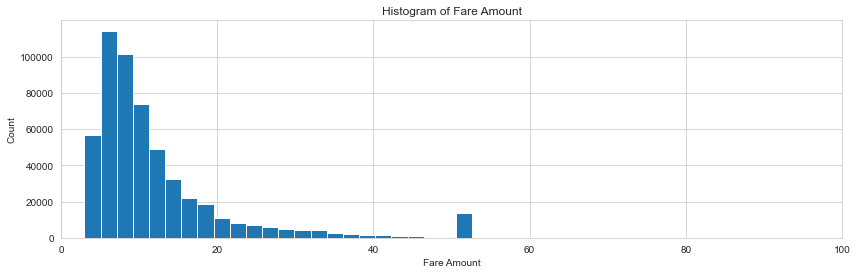

In [200]:
plt.figure(figsize=(14,4))
plt.hist(sample_train["fare_amount"],250)
plt.xlabel('Fare Amount')
plt.ylabel('Count')
plt.title('Histogram of Fare Amount')
plt.xlim(0,100);
plt.savefig('Histogram_Fare Amount.eps', format='eps')

In [111]:
nyc = folium.Map(location=[40.730610, -73.935242],zoom_start=12)

In [112]:
for i in sample_train.index[:1000]:
    folium.CircleMarker(location=[sample_train['PULocation_lat'][i],sample_train['PULocation_lon'][i]], color='green').add_to(nyc)

In [113]:
for i in sample_train.index[:10000]:
    folium.CircleMarker(location=[sample_train['DOLocationID_lat'][i],sample_train['DOLocationID_lon'][i]], color='red').add_to(nyc)

In [114]:
nyc

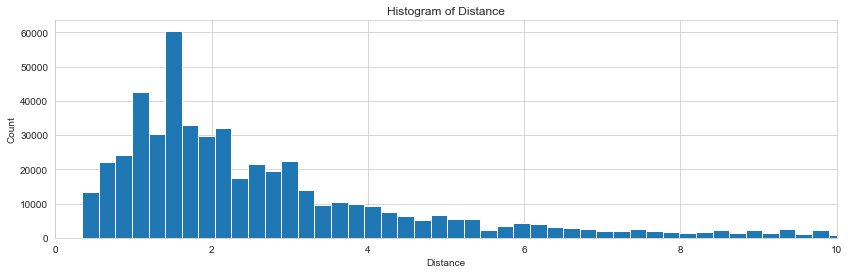

In [197]:
plt.figure(figsize=(14,4))
plt.hist(sample_train["distance"],200)
plt.xlabel('Distance')
plt.ylabel('Count')
plt.title('Histogram of Distance')
plt.xlim(0,10);
plt.savefig('Histogram_Distance.eps', format='eps')

540556
540556


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


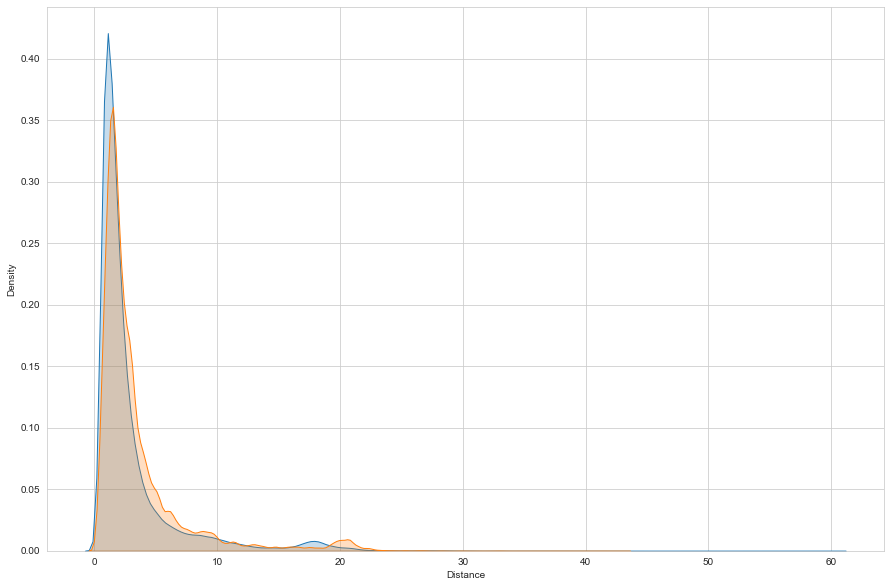

In [196]:
plt.figure(figsize=(15,10))
comparison_column = pd.Series(np.where(sample_train["trip_distance"] == sample_train["distance"], True, False))
print((comparison_column==True).count())
print((comparison_column==False).count())
comparison_column
plt.xlabel('Distance')
sns.kdeplot(data=sample_train['trip_distance'],label = "Trip Distance",shade=True )
sns.kdeplot(data=sample_train['distance'],label = "Distance",shade=True );
plt.savefig('Histogram_deffrents_Distance.eps', format='eps')

Scatter Plot distance vs Fare amount

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


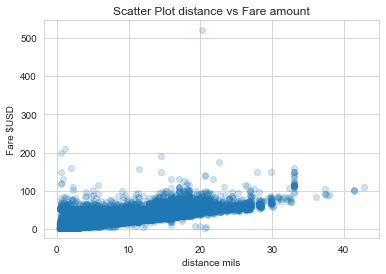

In [201]:
figsize=(20,8)
plt.scatter(sample_train['distance'],sample_train['fare_amount'], alpha=0.2)
plt.xlabel('distance mils')
plt.ylabel('Fare $USD')
plt.title('Scatter Plot distance vs Fare amount');
plt.savefig('Scatter_distance_Fareamount.eps', format='eps')

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


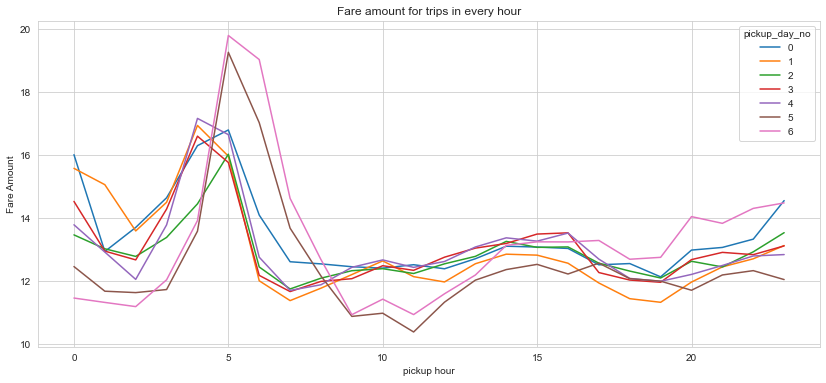

In [207]:
sample_train.pivot_table('fare_amount', index='pickup_hour', columns='pickup_day_no').plot(figsize=(14,6))
plt.xlabel('pickup hour');
plt.ylabel('Fare Amount');
plt.title('Fare amount for trips in every hour') 
plt.savefig('Fare_amount_every_hour.eps', format='eps')

The most visited area is : [236]


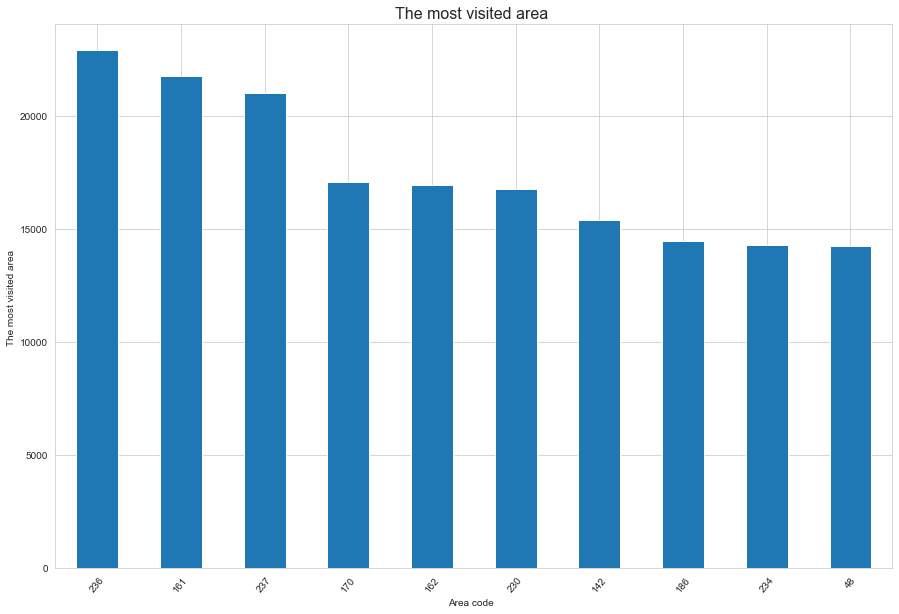

In [204]:
#Q1 : Where is the most visited area?  
n = 1
most_famous_Location= sample_train['DOLocationID'].value_counts()[:n].index.tolist()
print('The most visited area is :',most_famous_Location)
# visulatiziton Q1 :
m=10
plt.figure(figsize=(15,10))
sample_train['DOLocationID'].value_counts()[:m].plot.bar()
plt.xticks(rotation=50)
plt.xlabel("Area code  ")
plt.ylabel("The most visited area ")
plt.title('The most visited area ', fontsize=16)
plt.savefig('mostـvisitedـarea.eps', format='eps')
plt.show();

The most requested day for trips is : [4]


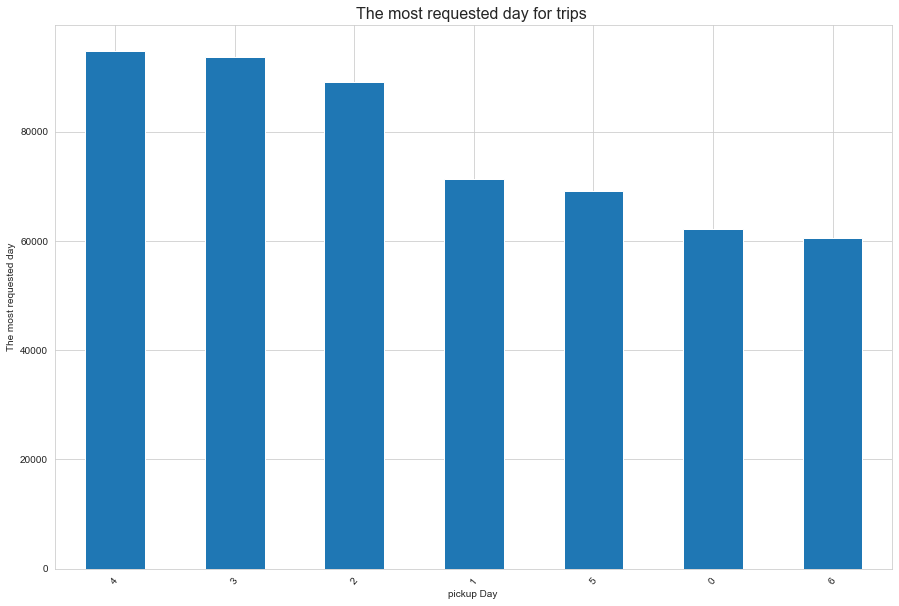

In [205]:
# Q2 When is the most requested day for trips?
n=1
most_requested_day= sample_train['pickup_day_no'].value_counts()[:n].index.tolist()
print('The most requested day for trips is :',most_requested_day)
# visulatiziton Q2 :
plt.figure(figsize=(15,10))
sample_train['pickup_day_no'].value_counts().plot.bar()
plt.xticks(rotation=50)
plt.xlabel("pickup Day ")
plt.ylabel("The most requested day")
plt.title('The most requested day for trips ', fontsize=16);
plt.savefig('mostـrequested_day.eps', format='eps')
plt.show();

In [209]:
def compute_pickups_per_day():
    time = sample_train[['tpep_pickup_datetime','tpep_dropoff_datetime']]
    time['tpep_pickup_datetime'] = pd.to_datetime(time['tpep_pickup_datetime'])
    time["pickup_day"] = time['tpep_pickup_datetime'].dt.strftime('%u').astype(int)
    time["pickup_hour"] = time['tpep_pickup_datetime'].dt.strftime('%H').astype(int)
    set(time['pickup_day'].values)
    day_pickups = []
    night_pickups = []
    mid_night_pickups = []
    afternoon_pickups = []
    for i in range(1,8):
        day_pickups.append(time[(time.pickup_day == i) & (time.pickup_hour >= 6) & (time.pickup_hour < 12)].shape[0])
        night_pickups.append(time[(time.pickup_day == i) & (time.pickup_hour >= 18) & (time.pickup_hour <= 23)].shape[0])
        mid_night_pickups.append(time[(time.pickup_day == i) & (time.pickup_hour >= 0) & (time.pickup_hour < 6)].shape[0])
        afternoon_pickups.append(time[(time.pickup_day == i) & (time.pickup_hour >= 12) & (time.pickup_hour < 18)].shape[0])
    
    days =pd.DataFrame({'morning':day_pickups, 'afternoon':afternoon_pickups, 'night':night_pickups, 'midnight':mid_night_pickups})
    days.plot(kind='bar', stacked=True,figsize=(15, 10))
    plt.title('Number of pickups for every Days of the week')
    plt.xlabel('Days of the week')
    plt.ylabel('Number of pickups')
    plt.tick_params(axis='both', which='minor')
    plt.plot()
    #plt.xticks(['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday'])
    days = ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']
    for i in range(0,len(days)):
        print ("{} -  morning:{} , day:{} , mid-day:{} night:{}".format(days[i],mid_night_pickups[i],day_pickups[i],afternoon_pickups[i],night_pickups[i]))
    
    return time

<ipython-input-209-8c62d450ea03>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  time['tpep_pickup_datetime'] = pd.to_datetime(time['tpep_pickup_datetime'])
<ipython-input-209-8c62d450ea03>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  time["pickup_day"] = time['tpep_pickup_datetime'].dt.strftime('%u').astype(int)
<ipython-input-209-8c62d450ea03>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the

Monday -  morning:3169 , day:17216 , mid-day:22516 night:19242
Tuesday -  morning:2803 , day:20211 , mid-day:24167 night:24151
Wednesday -  morning:8461 , day:22358 , mid-day:28828 night:29407
Thursday -  morning:4455 , day:24854 , mid-day:30963 night:33431
Friday -  morning:6208 , day:24247 , mid-day:30825 night:33470
Saturday -  morning:9727 , day:12478 , mid-day:23665 night:23184
Sunday -  morning:11106 , day:11122 , mid-day:22363 night:15929


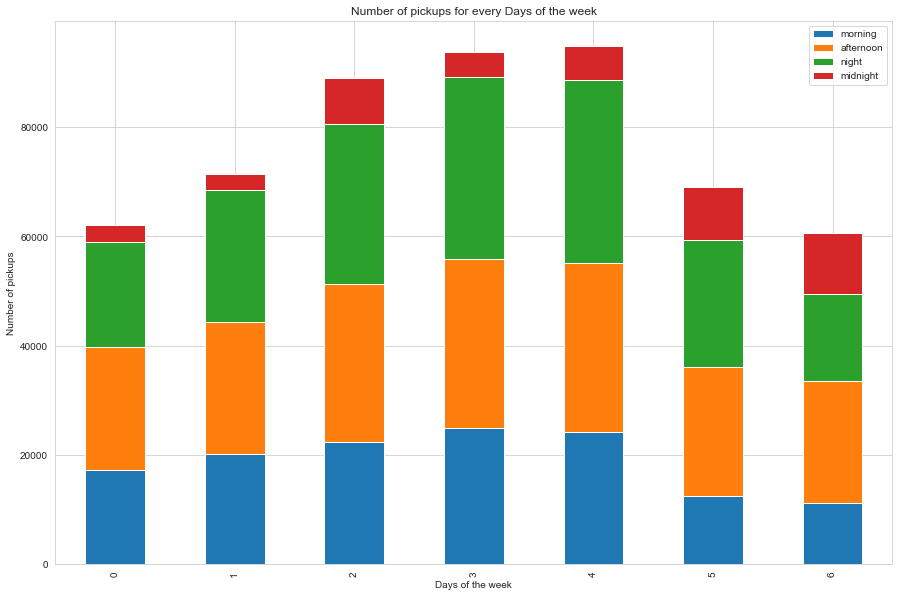

In [211]:
# Q3 :When is the most requested Time for trips?
times_of_day_dframe = compute_pickups_per_day()

plt.savefig('Number_pickups_Days_week.eps', format='eps')

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


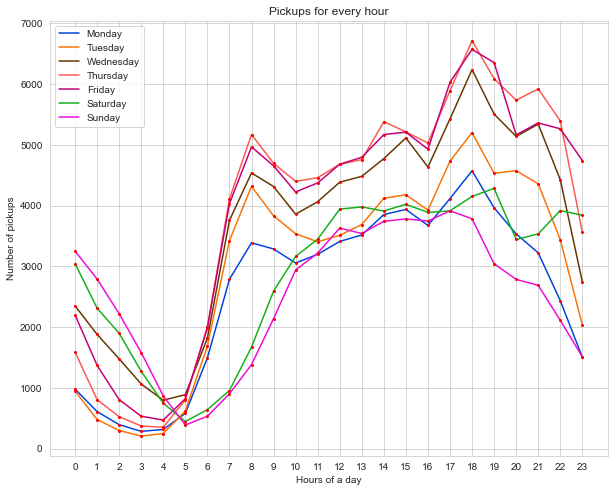

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


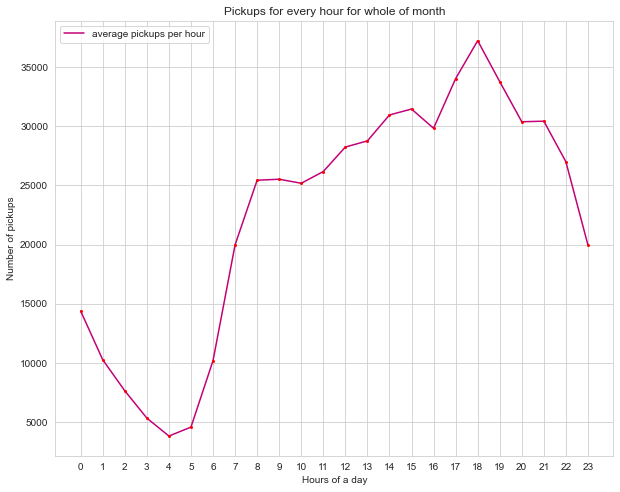

In [214]:
# Q4:What is the number of trips per hour?
def pickup_in_day(frame):
    hour_pickups = []
    temp = []
    for i in range(1,8):
        for j in range(0,24):
            temp.append(frame[(frame.pickup_day == i) & (frame.pickup_hour == j)].shape[0])
        hour_pickups.append(temp)
        temp = []
    colors = ['xkcd:blue','xkcd:orange','xkcd:brown','xkcd:coral','xkcd:magenta','xkcd:green','xkcd:fuchsia']
    days = ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']

    plt.figure(figsize=(10,8))
    hours_lis = [s for s in range(0,24)]
    for k in range(0,7):
        plt.plot(hours_lis,hour_pickups[k],colors[k],label = days[k])
        plt.plot(hours_lis,hour_pickups[k], 'ro',  markersize=2)

    plt.xticks([s for s in range(0,24)])
    plt.xlabel('Hours of a day')
    plt.ylabel('Number of pickups')
    plt.title('Pickups for every hour')
    plt.legend()
    plt.grid(True)
    plt.savefig('Pickups_every_hour.eps', format='eps')
    plt.show()
    
    hour_pickup_month = []
    for j in range(0,24):
        hour_pickup_month.append(frame[frame.pickup_hour == j].shape[0])

    plt.figure(figsize=(10,8))
    hours_lis = [s for s in range(0,24)]
    plt.plot(hours_lis,hour_pickup_month,'xkcd:magenta',label = 'average pickups per hour')
    plt.plot(hours_lis,hour_pickup_month, 'ro',  markersize=2)
    

    plt.xticks([s for s in range(0,24)])
    plt.xlabel('Hours of a day')
    plt.ylabel('Number of pickups')
    plt.title('Pickups for every hour for whole of month')
    plt.legend()
    plt.grid(True)
    plt.savefig('Pickups_every_hour_of_month.eps', format='eps')
    plt.show()
    
pickup_in_day(times_of_day_dframe)

In [295]:
pyment= sample_train["payment_type"].copy()

In [296]:
pyment = pyment.astype(np.int)

<ipython-input-296-e2b258985c2c>:1: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  pyment = pyment.astype(np.int)


In [297]:
pyment = pyment.astype(np.str)

<ipython-input-297-9eae977e81ad>:1: DeprecationWarning: `np.str` is a deprecated alias for the builtin `str`. To silence this warning, use `str` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.str_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  pyment = pyment.astype(np.str)


In [298]:
pyment=pyment.replace({'1':'Credit card', '2': 'Cash' , '3':'No charge', '4': 'Dispute'},regex=True)


In [299]:
pyment

0         Credit card
1         Credit card
2         Credit card
3         Credit card
4         Credit card
             ...     
540551    Credit card
540552    Credit card
540553    Credit card
540554    Credit card
540555           Cash
Name: payment_type, Length: 540556, dtype: object

The Most used payment method is : ['Credit card']


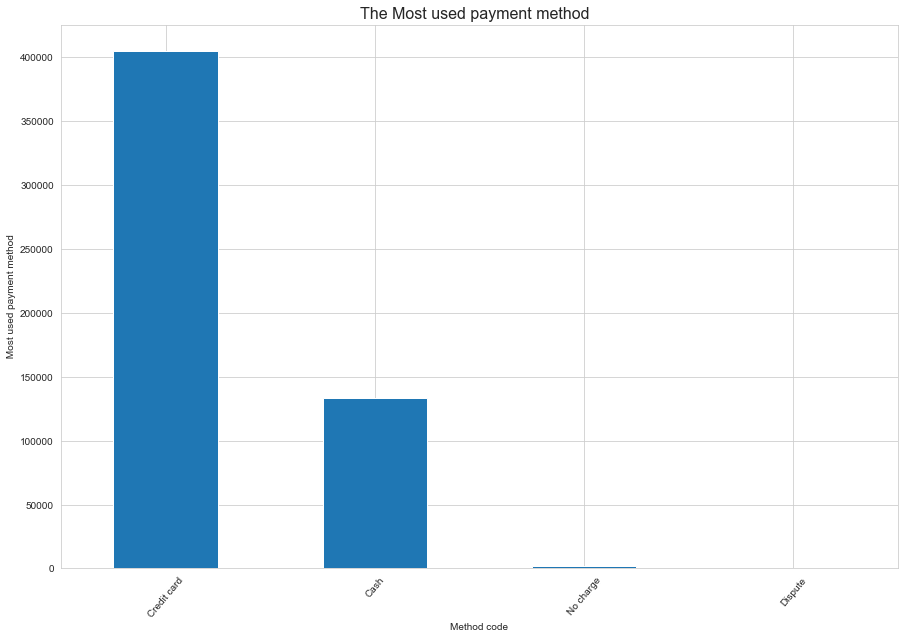

In [300]:
# Q5 : What is the most payment method used?
sns.set_style("whitegrid")
plt.figure(figsize=(15,10))
Most_payment_method= pyment.value_counts()[:n].index.tolist()
print('The Most used payment method is :',Most_payment_method)
pyment.value_counts().plot.bar()
plt.xticks(rotation=50)
plt.xlabel("Method code")
plt.ylabel(" Most used payment method")
plt.title('The Most used payment method  ', fontsize=16);
plt.savefig('Most_used_payment_method.eps', format='eps')
plt.show();

In [302]:
sample_train['passenger_count']=sample_train['passenger_count'].astype(int)

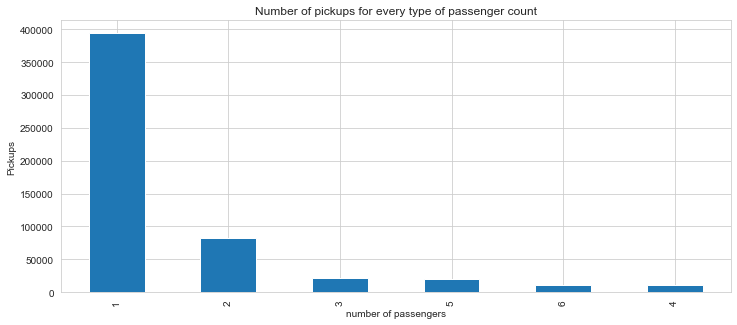

In [303]:
# Q5 : What is the umber of pickups for every type of passenger count?
sns.set_style("whitegrid")
fig, ax = plt.subplots()
fig.set_size_inches(12, 5)
sample_train['passenger_count'].value_counts().plot.bar()
plt.title('Number of pickups for every type of passenger count')
plt.xlabel('number of passengers')
plt.ylabel('Pickups');
plt.savefig('Number_pickups_passenger_count.eps', format='eps')

correletion

In [131]:
#sns.pairplot(sample_train[:1000], plot_kws=dict(alpha=.1, edgecolor='none'))

<AxesSubplot:>

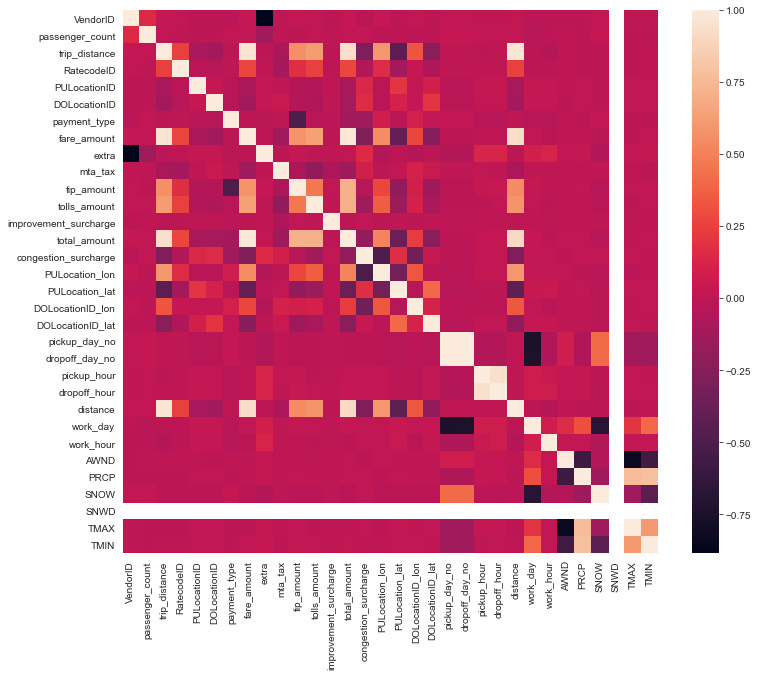

In [132]:
plt.figure(figsize=(12, 10))
sns.heatmap(sample_train.corr())

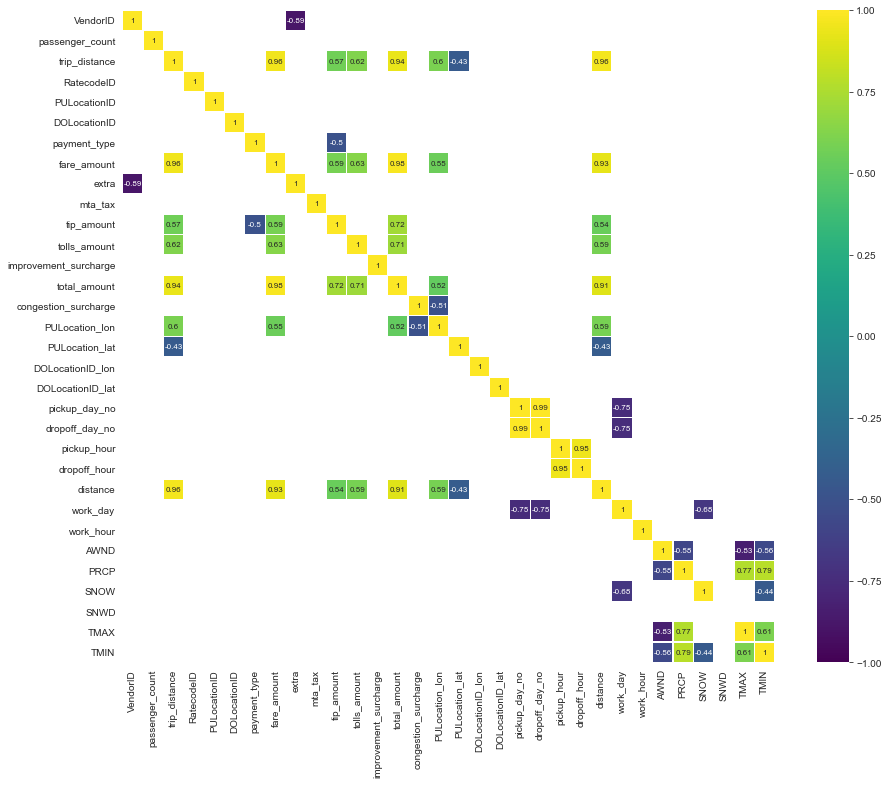

In [306]:
corr = sample_train.corr()
plt.figure(figsize=(15, 12))
sns.heatmap(corr[(corr >= 0.5) | (corr <= -0.4)], 
            cmap='viridis', vmax=1.0, vmin=-1.0, linewidths=0.1,
            annot=True, annot_kws={"size": 8}, square=True);
plt.savefig('heatmap.eps', format='eps')

In [133]:
df_num_corr = sample_train.corr()['fare_amount'][:-1] # -1 because the latest row is SalePrice
golden_features_list = df_num_corr[abs(df_num_corr) > 0.5].sort_values(ascending=False)
print("There is {} strongly correlated values with SalePrice:\n{}".format(len(golden_features_list), golden_features_list))

There is 7 strongly correlated values with SalePrice:
fare_amount       1.000000
total_amount      0.977653
trip_distance     0.956565
distance          0.926990
tolls_amount      0.632838
tip_amount        0.586893
PULocation_lon    0.551354
Name: fare_amount, dtype: float64


Linear Regression

In [135]:
X_train,y_train = x, sample_train['fare_amount']

In [136]:
lr_model = LinearRegression()
lr_model.fit(X_train, y_train)

LinearRegression()

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript back

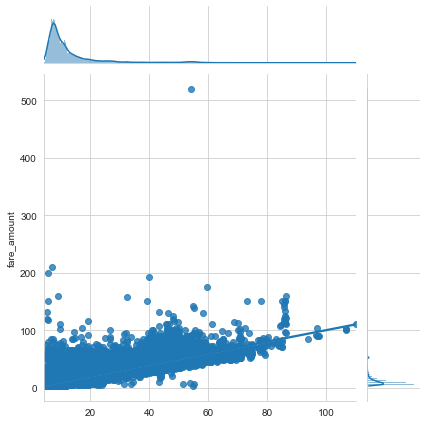

In [310]:
preds = lr_model.predict(X_train) 
sns.jointplot(x=preds,y=y_train, kind='reg')
plt.savefig('LinearRegression_training.eps', format='eps');

In [138]:
lr_model.score(X_train,y_train)

0.860233338919544

In [139]:
xx=sample_val[['congestion_surcharge','distance','pickup_day_no','pickup_hour'
              ,'AWND','PRCP','SNOW','SNWD','TMAX','TMIN','work_hour','work_day']]

In [140]:
X_val,y_val = xx, sample_val['fare_amount']

In [141]:
lr_model.score(X_val,y_val)

0.8675127729487423

In [142]:
xxx=sample_test[['congestion_surcharge','distance','pickup_day_no','pickup_hour'
              ,'AWND','PRCP','SNOW','SNWD','TMAX','TMIN','work_hour','work_day']]

In [143]:
X_test,y_test = xxx, sample_test['fare_amount']

In [144]:
acluracy=lr_model.score(X_test,y_test)
acluracy

0.8635074824268834

In [145]:
pred = lr_model.predict(X_test)

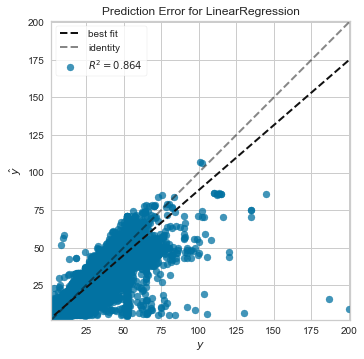

In [380]:
from yellowbrick.regressor import prediction_error
visualizer = prediction_error(lr_model, X_train, y_train, X_test, y_test)

In [146]:
res = pd.DataFrame(pred)

In [147]:
res['actual'] = y_test

In [148]:
res.columns=['predict','actual']

In [149]:
res['difference'] = res['predict'] - res['actual']

In [150]:
res

,predict,actual,difference
0,6.593018,10.0,-3.406982
1,6.593018,6.0,0.593018
2,7.333313,3.5,3.833313
3,6.593018,6.5,0.093018
4,6.585144,5.5,1.085144
...,...,...,...
180149,16.472717,20.0,-3.527283
180150,16.136780,14.0,2.136780
180151,16.144653,31.0,-14.855347
180152,78.145630,69.0,9.145630


In [151]:
degree = 2
est = make_pipeline(PolynomialFeatures(degree), LinearRegression())
est.fit(X_train, y_train)

Pipeline(steps=[('polynomialfeatures', PolynomialFeatures()),
                ('linearregression', LinearRegression())])

In [152]:
est.score(X_train,y_train)

0.8645506243421635

In [153]:
est.score(X_val,y_val)

0.8718909692260591

In [154]:
est.score(X_test,y_test)

0.8674240615749886

In [155]:
pred = est.predict(X_test)

In [156]:
res1 = pd.DataFrame(pred)

In [157]:
res1['actual'] = y_test

In [158]:
res1.columns=['predict','actual']

In [159]:
res1['difference'] = res1['predict'] - res1['actual']

In [160]:
res1 

,predict,actual,difference
0,7.115295,10.0,-2.884705
1,7.115295,6.0,1.115295
2,5.674377,3.5,2.174377
3,7.115295,6.5,0.615295
4,6.143127,5.5,0.643127
...,...,...,...
180149,16.297424,20.0,-3.702576
180150,15.065979,14.0,1.065979
180151,16.873596,31.0,-14.126404
180152,73.644104,69.0,4.644104
